# One-Day VNP46A2 / VNP46A1 / VJ146A2 Stray-Light Comparison - Native 500 m Discrete Lit Grid

This notebook compares the A1/VJ diagnostic outputs for the same review dates used in `stray_light_blackmarbler_redownload_comparison.ipynb`: `2023-10-20`, `2023-02-28`, and `2023-01-29`.

The maps use the native 500 m grid and a discrete threshold class computed from each scenario radiance band: `0` for valid pixels with `rad < 1`, `1` for valid pixels with `rad >= 1`, and gray for invalid or missing pixels. This view is for inspecting exactly which pixels would be considered lit at a threshold of `1`.

It does not download data and does not change production outputs.


In [1]:
from pathlib import Path

import pandas as pd
from IPython.display import Image, display

DATES = ["2023-10-20", "2023-02-28", "2023-01-29"]


def find_repo_root(start: Path) -> Path:
    start = start.resolve()
    for path in [start, *start.parents]:
        if (path / "STRAY_LIGHT_FIX_PLAN.md").exists() and (path / "blackmarbler").exists():
            return path
        nested = path / "6-codebases" / "repos" / "Reliability-Assessment"
        if (nested / "STRAY_LIGHT_FIX_PLAN.md").exists() and (nested / "blackmarbler").exists():
            return nested
    raise FileNotFoundError("Could not locate Reliability-Assessment repo root.")


ROOT = find_repo_root(Path.cwd())
OUT_DIR = ROOT / "blackmarbler" / "out_vnp46a2_sa_daily" / "qa_straylight_validation" / "one_day_a1_vj"
PRESENTATION_PANEL_DIR = OUT_DIR / "png" / "lit500m_presentation"
SEPARATE_PANEL_DIR = PRESENTATION_PANEL_DIR / "separate_panels"


def paths_for_date(date: str) -> dict:
    return {
        "summary": OUT_DIR / f"one_day_a1_vj_summary_ge1_{date}.csv",
        "masks": OUT_DIR / f"one_day_a1_vj_mask_shares_{date}.csv",
        "panel": PRESENTATION_PANEL_DIR / f"lit500m_presentation_comparison_{date}.png",
    }


In [2]:
required = []
for date in DATES:
    p = paths_for_date(date)
    required.extend([p["summary"], p["masks"], p["panel"]])
missing = [p for p in required if not p.exists()]
if missing:
    raise FileNotFoundError(
        "Run stray_light_one_day_a1_vj_diagnostic.R and render the 500 m discrete lit panels first. Missing:\n"
        + "\n".join(str(p) for p in missing)
    )

summary = pd.concat([pd.read_csv(paths_for_date(date)["summary"]) for date in DATES], ignore_index=True)
masks = pd.concat([pd.read_csv(paths_for_date(date)["masks"]) for date in DATES], ignore_index=True)
summary["date"] = summary["date"].astype(str)
masks["date"] = masks["date"].astype(str)

summary


,date,scenario,n_total_pixels,n_valid_pixels,n_lit_pixels,valid_share,p_lit,lit_share_all,mean_rad_valid
0,2023-10-20,Current VNP46A2,12035300,8441737,3225411,0.701415,0.382079,0.267996,1.235085
1,2023-10-20,VNP46A2 + A1 stray bit,12035300,8441628,3225382,0.701406,0.382081,0.267993,1.235091
2,2023-10-20,VNP46A2 + A1 strict DNB bits,12035300,8441628,3225382,0.701406,0.382081,0.267993,1.235091
3,2023-10-20,VJ146A2 candidate C2 mask,12035300,4066574,258869,0.337887,0.063658,0.021509,0.704628
4,2023-10-20,Blend: VNP strict else VJ,12035300,8747151,3233290,0.726791,0.369639,0.268651,1.210424
5,2023-02-28,Current VNP46A2,12035300,6962763,2523953,0.578528,0.362493,0.209713,1.119453
6,2023-02-28,VNP46A2 + A1 stray bit,12035300,6962591,2523912,0.578514,0.362496,0.209709,1.119460
7,2023-02-28,VNP46A2 + A1 strict DNB bits,12035300,6962591,2523912,0.578514,0.362496,0.209709,1.119460
8,2023-02-28,VJ146A2 candidate C2 mask,12035300,4765877,121963,0.395992,0.025591,0.010134,0.382492
9,2023-02-28,Blend: VNP strict else VJ,12035300,7571760,2552270,0.629129,0.337078,0.212065,1.074546


## Native 500 m Discrete Lit Mask Panels

Each panel is rendered at the native Black Marble grid resolution using a binary threshold class. Dark means valid and unlit (`rad < 1`), yellow means lit (`rad >= 1`), and gray means invalid or missing.


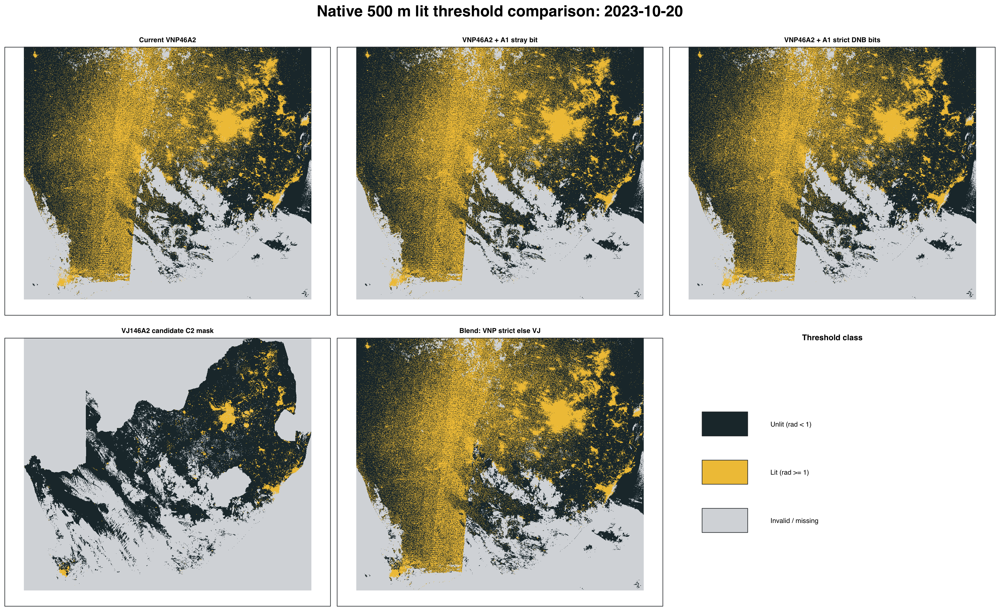

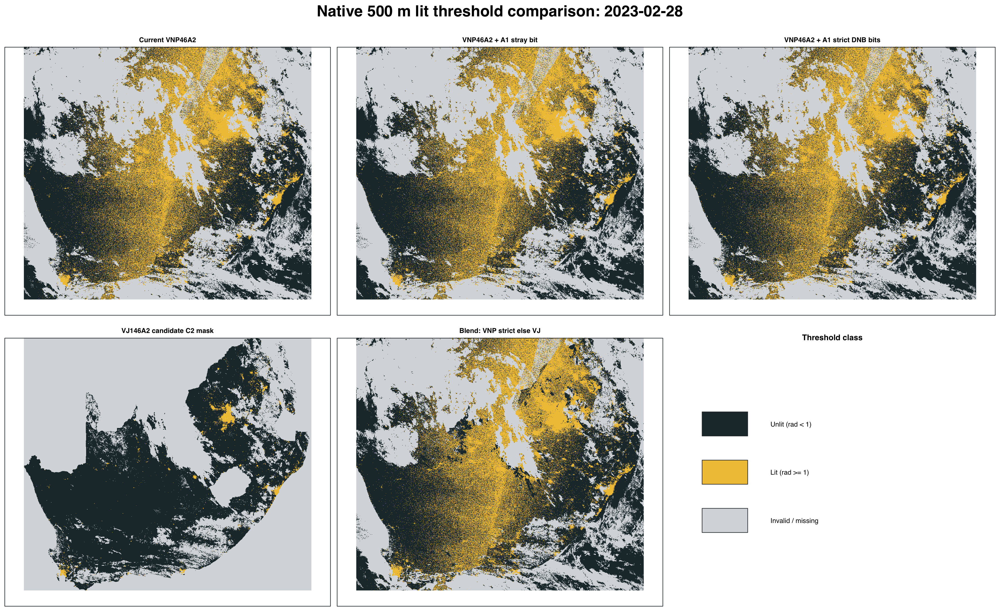

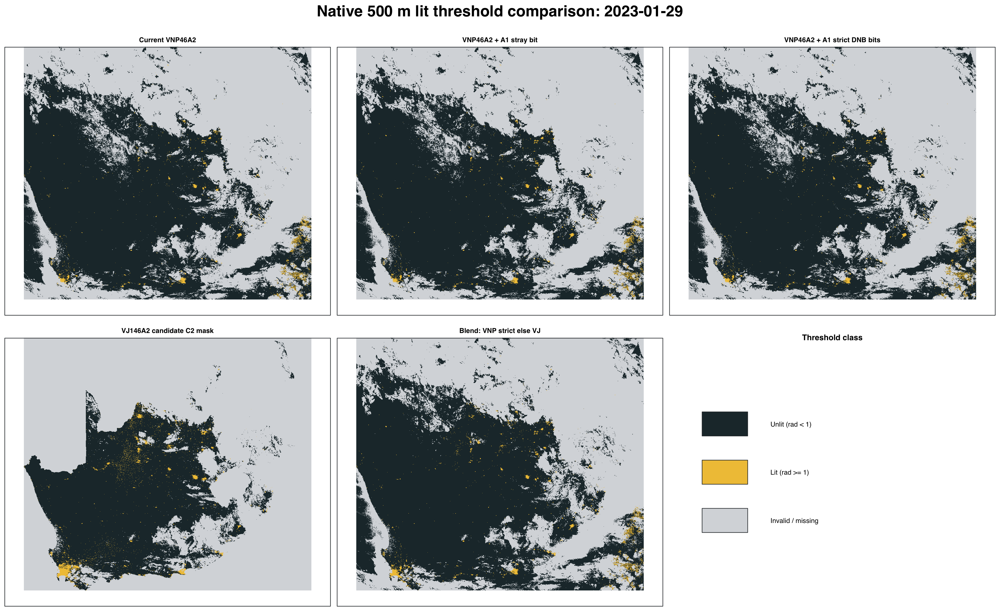

In [3]:
for date in DATES:
    display(Image(filename=str(paths_for_date(date)["panel"]), width=1500))


## Separate Readable Panels

These standalone panels use the same native 500 m threshold class with a discrete two-color scale. They are easier to inspect than the five-panel overview when checking whether the broad stray-light swath still enters the pipeline as lit.


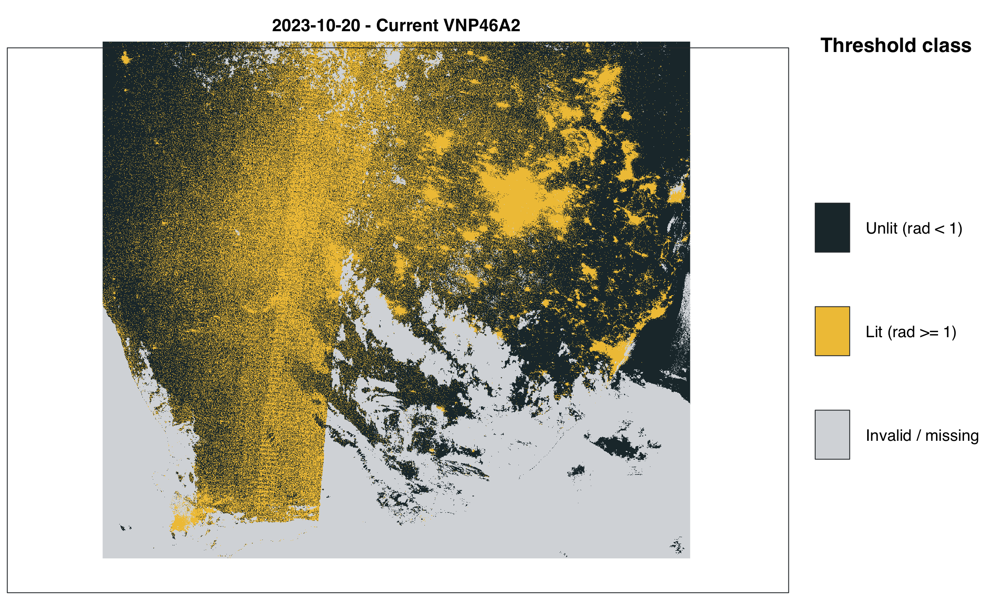

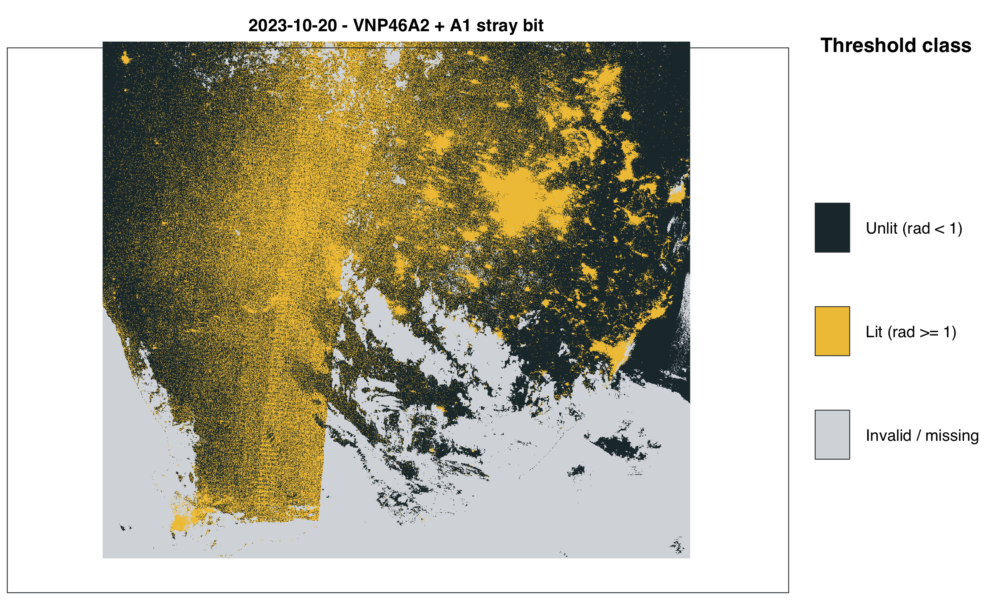

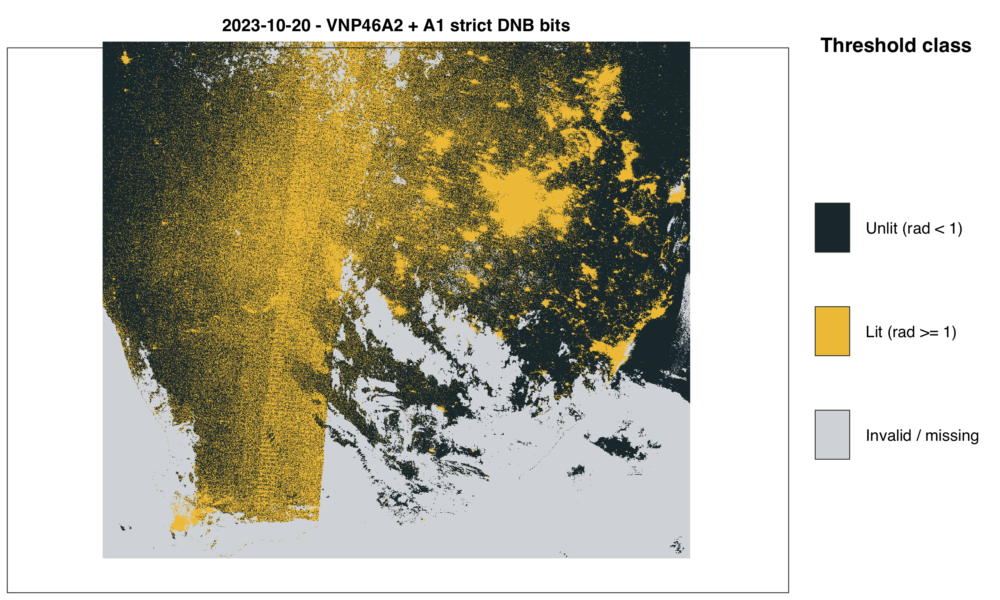

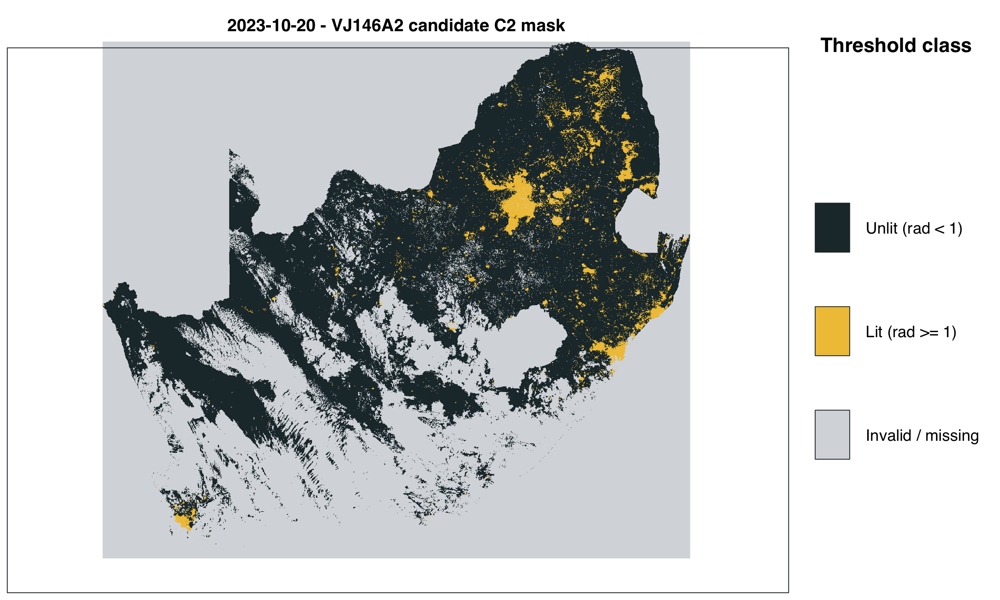

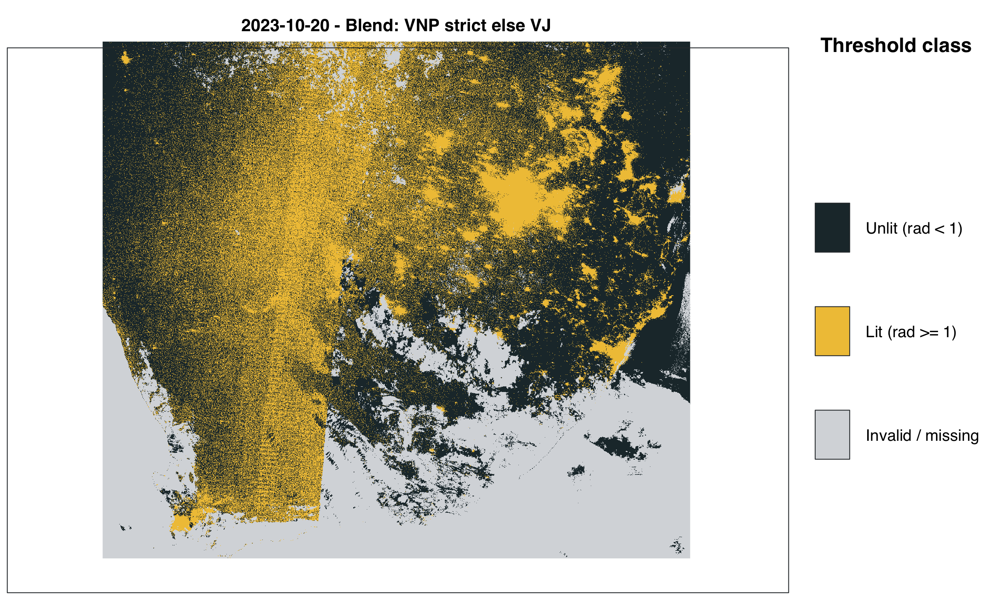

...

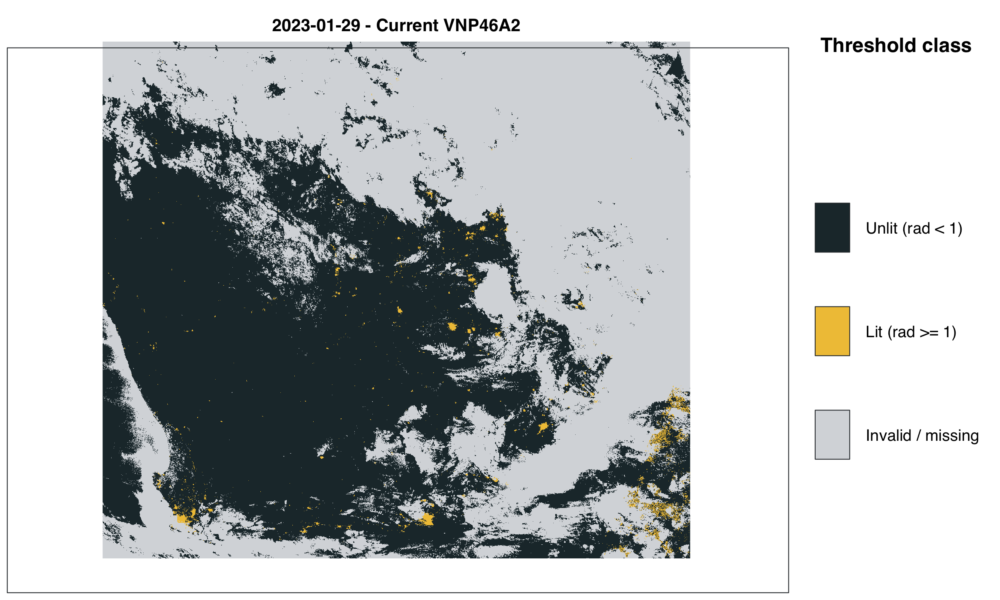

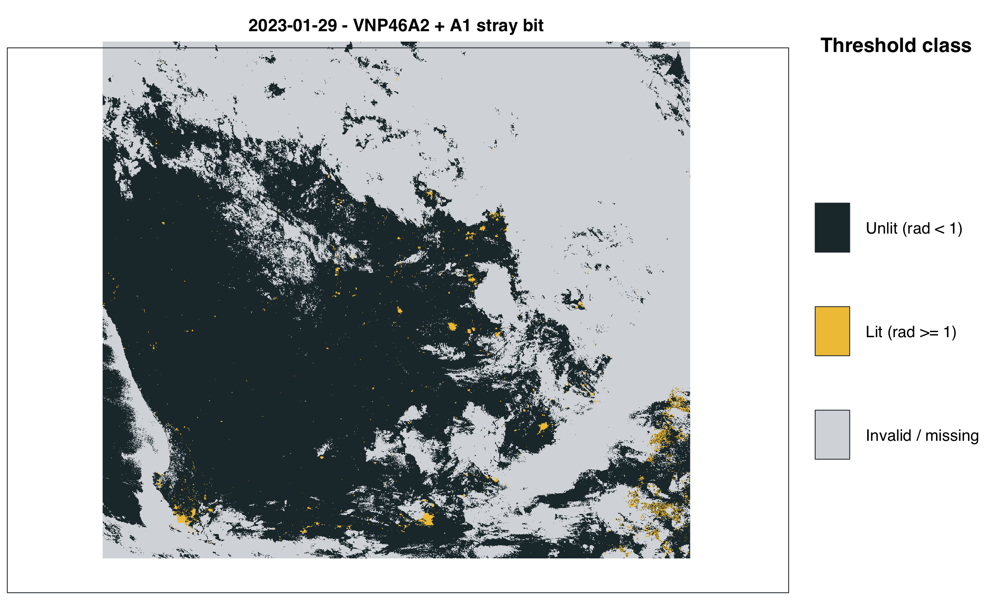

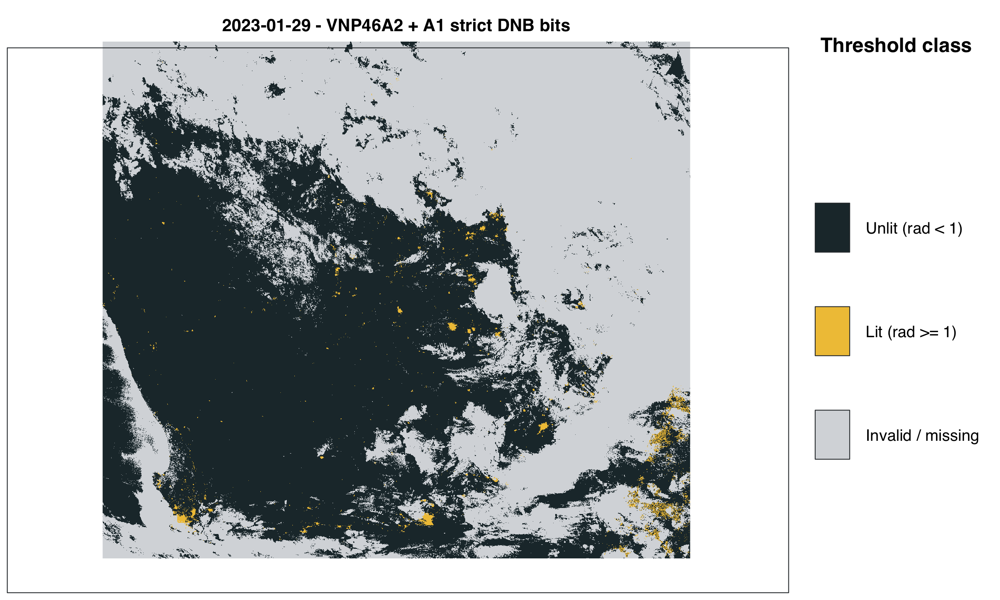

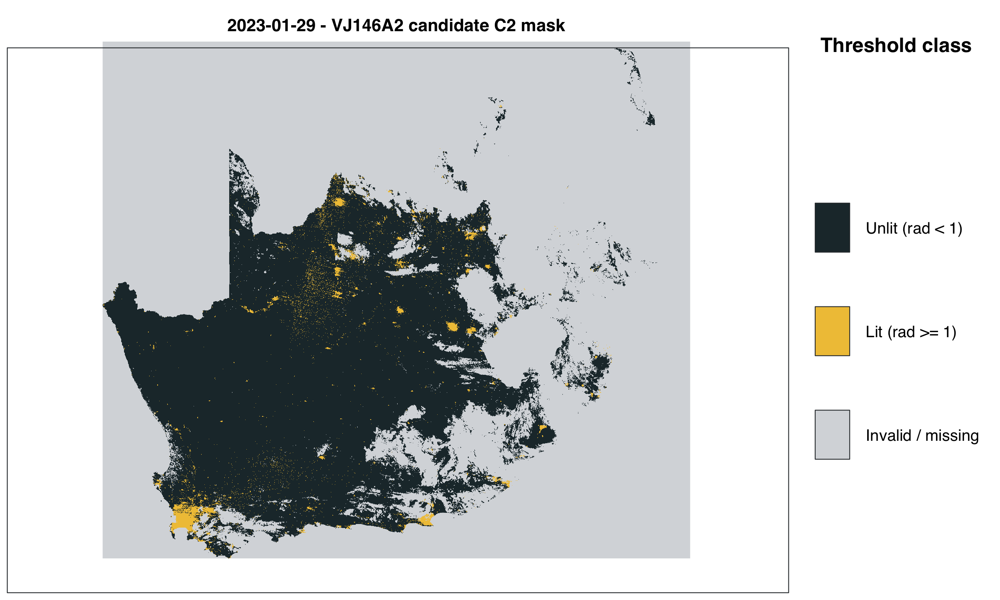

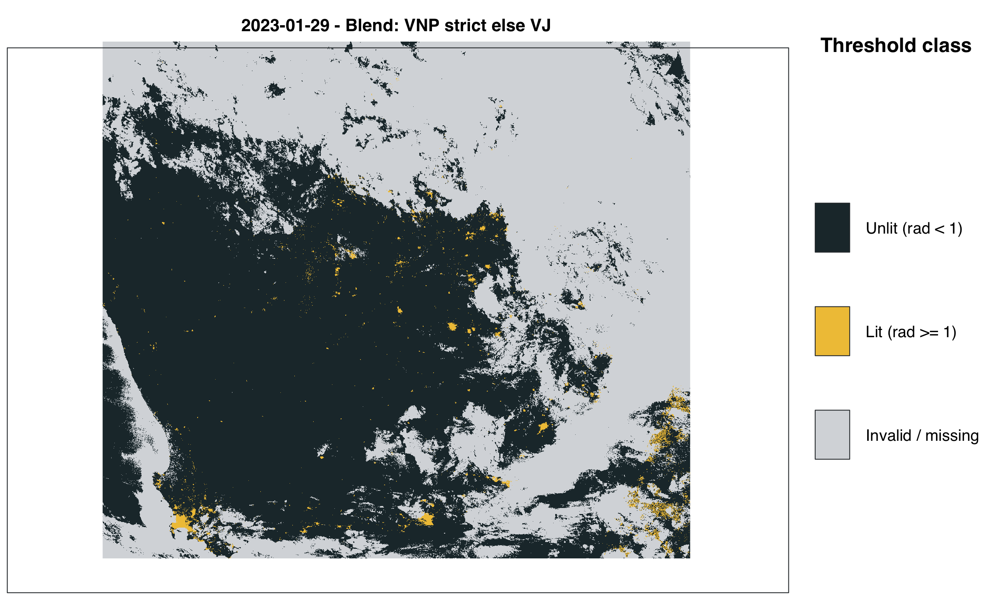

In [4]:
panel_files = {
    "Current VNP46A2": "current_vnp46a2",
    "VNP46A2 + A1 stray bit": "vnp46a2_a1_stray_bit",
    "VNP46A2 + A1 strict DNB bits": "vnp46a2_a1_strict_dnb_bits",
    "VJ146A2 candidate C2 mask": "vj146a2_candidate_c2_mask",
    "Blend: VNP strict else VJ": "blend_vnp_strict_else_vj",
}

for date in DATES:
    for scenario, stem in panel_files.items():
        out_png = SEPARATE_PANEL_DIR / f"{stem}_{date}_lit500m_presentation.png"
        if not out_png.exists():
            raise FileNotFoundError(out_png)
        display(Image(filename=str(out_png), width=1250))


## Quantitative Comparison

`p_lit` is lit share among valid pixels. `lit_share_all` is lit share over all pixels in the South Africa-minus-Lesotho raster. These values are computed with the same discrete threshold used in the maps: `rad >= 1`.


In [5]:
display_cols = ["date", "scenario", "valid_share", "p_lit", "lit_share_all", "mean_rad_valid", "n_valid_pixels", "n_lit_pixels"]
summary[display_cols].sort_values(["date", "scenario"])


,date,scenario,valid_share,p_lit,lit_share_all,mean_rad_valid,n_valid_pixels,n_lit_pixels
14,2023-01-29,Blend: VNP strict else VJ,0.514719,0.018138,0.009336,0.363291,6194801,112359
10,2023-01-29,Current VNP46A2,0.485332,0.015175,0.007365,0.331318,5841122,88637
13,2023-01-29,VJ146A2 candidate C2 mask,0.312251,0.030872,0.009640,0.605147,3758036,116019
11,2023-01-29,VNP46A2 + A1 stray bit,0.484729,0.015191,0.007364,0.331282,5833859,88622
12,2023-01-29,VNP46A2 + A1 strict DNB bits,0.484729,0.015191,0.007364,0.331282,5833859,88622
9,2023-02-28,Blend: VNP strict else VJ,0.629129,0.337078,0.212065,1.074546,7571760,2552270
5,2023-02-28,Current VNP46A2,0.578528,0.362493,0.209713,1.119453,6962763,2523953
8,2023-02-28,VJ146A2 candidate C2 mask,0.395992,0.025591,0.010134,0.382492,4765877,121963
6,2023-02-28,VNP46A2 + A1 stray bit,0.578514,0.362496,0.209709,1.119460,6962591,2523912
7,2023-02-28,VNP46A2 + A1 strict DNB bits,0.578514,0.362496,0.209709,1.119460,6962591,2523912


In [6]:
comparisons = []
for date in DATES:
    date_rows = summary.loc[summary["date"] == date].copy()
    baseline = date_rows.loc[date_rows["scenario"] == "Current VNP46A2"].iloc[0]
    date_rows["delta_valid_share_vs_current"] = date_rows["valid_share"] - baseline["valid_share"]
    date_rows["delta_p_lit_vs_current"] = date_rows["p_lit"] - baseline["p_lit"]
    date_rows["delta_lit_share_all_vs_current"] = date_rows["lit_share_all"] - baseline["lit_share_all"]
    comparisons.append(date_rows)

comparison = pd.concat(comparisons, ignore_index=True)
comparison[["date", "scenario", "delta_valid_share_vs_current", "delta_p_lit_vs_current", "delta_lit_share_all_vs_current"]]


,date,scenario,delta_valid_share_vs_current,delta_p_lit_vs_current,delta_lit_share_all_vs_current
0,2023-10-20,Current VNP46A2,0.000000,0.000000,0.000000
1,2023-10-20,VNP46A2 + A1 stray bit,-0.000009,0.000001,-0.000002
2,2023-10-20,VNP46A2 + A1 strict DNB bits,-0.000009,0.000001,-0.000002
3,2023-10-20,VJ146A2 candidate C2 mask,-0.363528,-0.318421,-0.246487
4,2023-10-20,Blend: VNP strict else VJ,0.025377,-0.012440,0.000655
5,2023-02-28,Current VNP46A2,0.000000,0.000000,0.000000
6,2023-02-28,VNP46A2 + A1 stray bit,-0.000014,0.000003,-0.000003
7,2023-02-28,VNP46A2 + A1 strict DNB bits,-0.000014,0.000003,-0.000003
8,2023-02-28,VJ146A2 candidate C2 mask,-0.182537,-0.336902,-0.199579
9,2023-02-28,Blend: VNP strict else VJ,0.050601,-0.025416,0.002353


## A1 QF_DNB Mask Check

This confirms whether the VNP46A1 DNB QA bits actually reject any pixels on these dates.


In [7]:
masks


,date,mask,n_total_pixels,n_flagged_pixels,share_flagged
0,2023-10-20,a1_qf_dnb_stray_16,12035300,0,0.000000
1,2023-10-20,a1_qf_dnb_strict_bad_bits,12035300,0,0.000000
2,2023-02-28,a1_qf_dnb_stray_16,12035300,0,0.000000
3,2023-02-28,a1_qf_dnb_strict_bad_bits,12035300,0,0.000000
4,2023-01-29,a1_qf_dnb_stray_16,12035300,9217,0.000766
5,2023-01-29,a1_qf_dnb_strict_bad_bits,12035300,9217,0.000766


## Takeaway

On the contaminated review dates, the current VNP46A2 discrete threshold class shows broad non-settlement areas entering the lit category. The VNP46A1 QA masks do not remove that pattern in these examples. VJ146A2 is visibly cleaner on the contaminated dates, while the clean-control date still argues against blanket replacement without a contamination gate.
